# Setup

In [9]:
import scrnatools as rna
import matplotlib.pyplot as plt
import anndata as ad
import seaborn as sns
import scanpy as sc
import scvi
import celltypist
import shutil
import pandas as pd
from celltypist import models
import os

In [10]:
os.getcwd()

'/home/joe/Repositories/human_ILC2/code'

In [11]:
sc.set_figure_params(figsize=(4,4), dpi=150, dpi_save=300, facecolor="white", frameon=False)
plt.rcParams["axes.grid"] = False
rna.configs.verbosity = "info"

## Data paths

### demeter

In [12]:
rawDataPath = "/mnt/iacchus/joe/raw_data/"
processedDataPath = "/mnt/iacchus/joe/processed_data/"

### gardner-lab-computer

In [13]:
# rawDataPath = "/mnt/e/Archive/Joe/raw_data/"
# processedDataPath = "/mnt/e/Archive/Joe/processed_data/"

# Import data

In [14]:
LP_D1 = sc.read_10x_h5(f"{rawDataPath}ILC2/run1_COlibraryprep/LPfiltered_feature_bc_matrix.h5")
LP_D1.var_names_make_unique()
LP_D1.obs["batch_key"] = "LP_D1"
LP_D1.obs["donor"] = "1"
LP_D1.obs["compartment"] = "LP"

MS_D1 = sc.read_10x_h5(f"{rawDataPath}ILC2/run1_COlibraryprep/MSfiltered_feature_bc_matrix.h5")
MS_D1.var_names_make_unique()
MS_D1.obs["batch_key"] = "MS_D1"
MS_D1.obs["donor"] = "1"
MS_D1.obs["compartment"] = "MS"

LP_D2 = sc.read_10x_h5(f"{rawDataPath}ILC2/run2_coreprep/LP_62442_filtered_feature_bc_matrix.h5")
LP_D2.var_names_make_unique()
LP_D2.obs["batch_key"] = "LP_D2"
LP_D2.obs["donor"] = "2"
LP_D2.obs["compartment"] = "LP"

MS_D2 = sc.read_10x_h5(f"{rawDataPath}ILC2/run2_coreprep/MS_62442_filtered_feature_bc_matrix.h5")
MS_D2.var_names_make_unique()
MS_D2.obs["batch_key"] = "MS_D2"
MS_D2.obs["donor"] = "2"
MS_D2.obs["compartment"] = "MS"

## Merge datasets

In [15]:
adata = ad.concat([LP_D1, MS_D1, LP_D2, MS_D2], index_unique="_")
# preserve raw counts for scvi
adata.layers["raw_counts"] = adata.X.copy()

In [16]:
adata

AnnData object with n_obs × n_vars = 11609 × 36601
    obs: 'batch_key', 'donor', 'compartment'
    layers: 'raw_counts'

# Doublet removal

Uses scrublet (https://github.com/swolock/scrublet) to filter out potential doublets in each batch

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.44
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 1.0%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 15.9%
Elapsed time: 1.4 seconds
Detected doublet rate = 1.8%
Estimated detectable doublet fraction = 5.9%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 30.7%
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.37
Detected doublet rate = 1.9%
Estimated detectable doublet fraction = 4.4%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 43.4%
Elapsed time: 0.3 seconds
Detected doublet rate = 5.6%
Estimated detectable doublet fraction = 10.2%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 54.9%
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculati

2023-03-06 23:05:07 - scrublet - INFO: 1.568% of cells classified as doublets (182 cells)
1.568% of cells classified as doublets (182 cells)


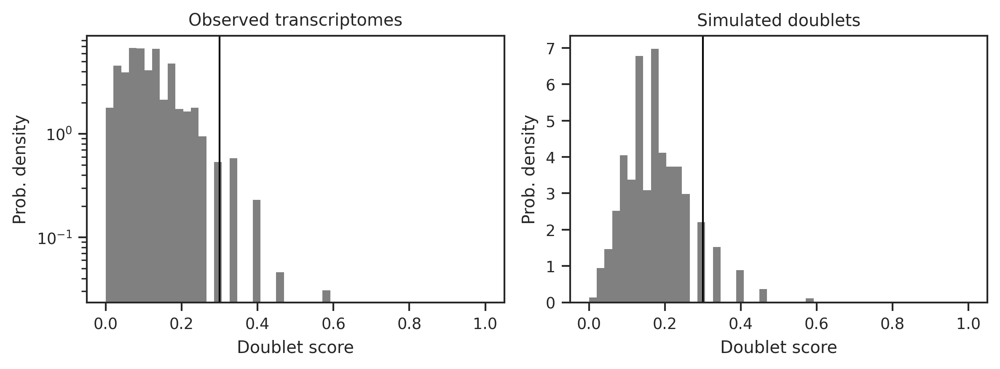

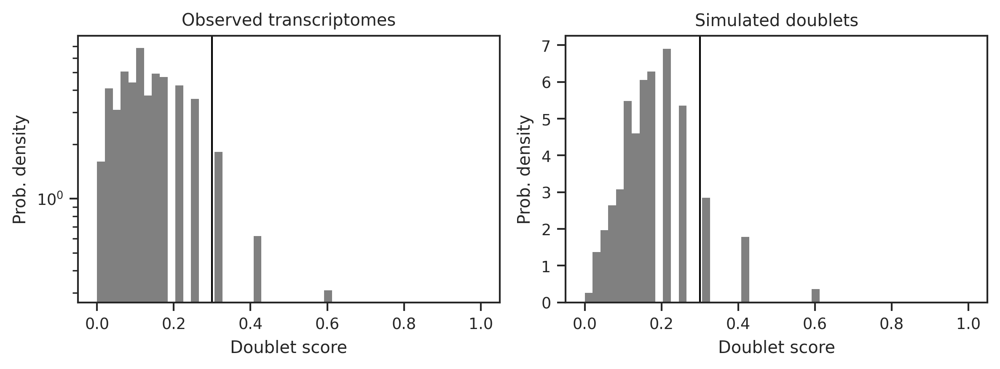

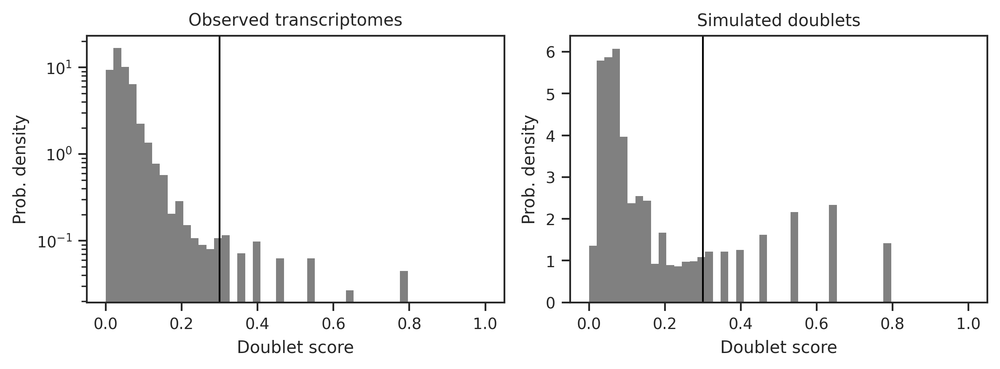

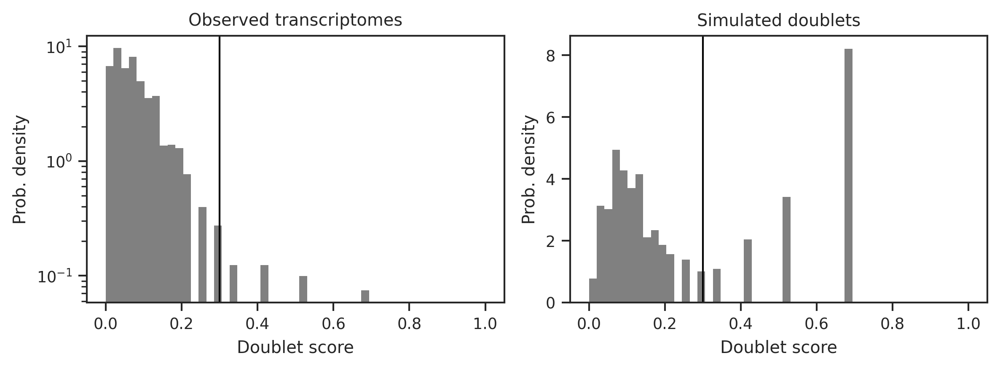

In [19]:
adata = rna.qc.scrublet(
    adata,
    doublet_threshold = 0.3, # Score threshold to use to call doublets
    batch_key = "batch_key", # Use batch information from a column in 'adata.obs' to run scrublet on each batch independently
    raw_counts_layer = "raw_counts" # use the raw counts data
)

In [20]:
adata

AnnData object with n_obs × n_vars = 11427 × 31529
    obs: 'batch_key', 'donor', 'compartment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'scrublet_score', 'scrublet_called_doublet'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    layers: 'raw_counts'

# Preprocessing

## Get QC metrics using scanpy

In [21]:
# Annotate mito genes
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# Get qc metrics for each cell, gene
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True, percent_top=None, log1p=False,)
# Basic prefiltering of empty cells, 0 counts genes
sc.pp.filter_cells(adata, min_genes=1)
sc.pp.filter_genes(adata, min_cells=1)

## Filter cells based on QC metrics

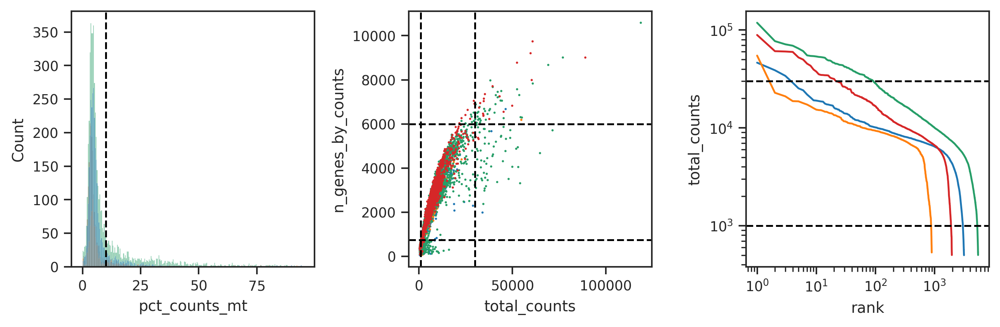

In [22]:
counts_thresholds=(1000, 30000) # The lower and upper total_counts thresholds
genes_thresholds=(750, 6000) # The lower and upper n_genes_by_counts thresholds
mt_threshold=10 # The pct_counts_mt threshold

rna.pl.qc_plotting(
    adata,
    counts_thresholds=counts_thresholds,
    genes_thresholds=genes_thresholds,
    mt_threshold=mt_threshold,
    show_thresholds=True,
    batch_key="batch_key",
    show_legend=False,
    figsize=(9, 3),
    dpi=300,
    # save_path="analysis/qc_plots.png",
)

2023-03-06 23:05:11 - filter_cells - INFO: Number of cells before QC filtering: 11427
Number of cells before QC filtering: 11427
2023-03-06 23:05:11 - filter_cells - INFO: Number of cells after QC filtering: 8702
Number of cells after QC filtering: 8702
2023-03-06 23:05:11 - qc_plotting - INFO: Saving figure to ../analysis/filtered_qc_plots.pdf
Saving figure to ../analysis/filtered_qc_plots.pdf


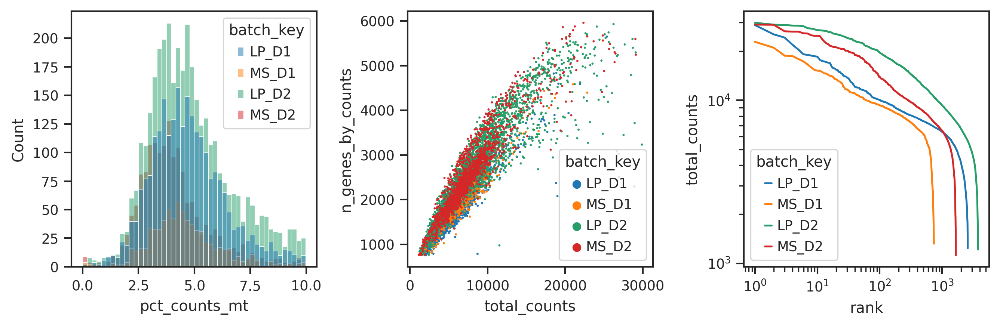

In [23]:
filteredAdata = rna.qc.filter_cells(
    adata,
    counts_thresholds=counts_thresholds,
    genes_thresholds=genes_thresholds,
    mt_threshold=mt_threshold,
)
rna.pl.qc_plotting(
    filteredAdata,
    show_thresholds=False,
    batch_key="batch_key",
    save_path="../analysis/filtered_qc_plots.pdf",
)

In [24]:
adata = filteredAdata
del filteredAdata

In [25]:
adata

AnnData object with n_obs × n_vars = 8702 × 31482
    obs: 'batch_key', 'donor', 'compartment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'scrublet_score', 'scrublet_called_doublet'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    layers: 'raw_counts'

## Log transform data with scanpy

In [33]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata # Preserve log-transformed counts in the raw attribute

## Save raw data

In [34]:
adata.write(f"{processedDataPath}/human_ILC2/h5ad_files/human_merged_raw.h5ad")

... storing 'batch_key' as categorical
... storing 'donor' as categorical
... storing 'compartment' as categorical


## Subset genes

In [15]:
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=5000, # Number of HVGs to keep
    subset=True, # Subset the adata in place
    layer="raw_counts", # Use the raw counts data for calculations
    flavor="seurat_v3", # HVG algorithm to use
    batch_key="batch_key", # Column in adata.obs that annotates batches of data
)

In [16]:
adata

AnnData object with n_obs × n_vars = 8702 × 5000
    obs: 'batch_key', 'donor', 'compartment', 'scrublet_score', 'scrublet_called_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'hvg'
    layers: 'raw_counts'

## Normalize data with scanpy

In [17]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)
# Scanpy normalized expression is now stored in adata.X

## Normalize data with scVI

In [20]:
# Setup scVI model using raw counts and batch info
scvi.model.SCVI.setup_anndata(
    adata,
    layer="raw_counts",
    batch_key="batch_key",
)
model = scvi.model.SCVI(adata)

In [21]:
# Train scVI model - run on google colab with a GPU session or a PC with an Nvidia GPU
model.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 400/400: 100%|██████████| 400/400 [02:21<00:00,  2.98it/s, loss=1.43e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:21<00:00,  2.83it/s, loss=1.43e+03, v_num=1]


In [22]:
# get scVI latent space and normalized expression
adata.obsm["X_scVI"] = model.get_latent_representation()
adata.layers["scVI_normalized"] = model.get_normalized_expression(library_size=1e4)

In [23]:
# Check save paths
if not os.path.isdir(f"{processedDataPath}/human_ILC2/scVI_models"):
    os.makedirs(f"{processedDataPath}/human_ILC2/scVI_models")
    
if not os.path.isdir(f"{processedDataPath}/human_ILC2/h5ad_files"):
    os.makedirs(f"{processedDataPath}/human_ILC2/h5ad_files")
    
if os.path.isdir(f"{processedDataPath}/human_ILC2/scVI_models/human_merged_5000_HVG"):
    shutil.rmtree(f"{processedDataPath}/human_ILC2/scVI_models/human_merged_5000_HVG")
    
# save the scVI model and adata object before further processing because training is non-deterministic
model.save(f"{processedDataPath}/human_ILC2/scVI_models/human_merged_5000_HVG")
adata.write(f"{processedDataPath}/human_ILC2/h5ad_files/human_merged_5000_HVG.h5ad")

In [7]:
# To reload saved adata/scVI model later:
adata = sc.read(f"{processedDataPath}/human_ILC2/h5ad_files/human_merged_5000_HVG.h5ad")
model = scvi.model.SCVI.load(f"{processedDataPath}/human_ILC2/scVI_models/human_merged_5000_HVG", adata=adata)

INFO     File /mnt/iacchus/joe/processed_data//human_ILC2/scVI_models/human_merged_5000_HVG/model.pt already       
         downloaded                                                                                                


Unable to initialize backend 'tpu_driver': NOT_FOUND: Unable to find driver in registry given worker: 
Unable to initialize backend 'cuda': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
Unable to initialize backend 'tpu': INVALID_ARGUMENT: TpuPlatform is not available.
Unable to initialize backend 'plugin': xla_extension has no attributes named get_plugin_device_client. Compile TensorFlow with //tensorflow/compiler/xla/python:enable_plugin_device set to true (defaults to false) to enable this.
No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


In [7]:
adata

AnnData object with n_obs × n_vars = 8702 × 5000
    obs: 'batch_key', 'donor', 'compartment', 'scrublet_score', 'scrublet_called_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_scVI'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mean', 'std'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'batch_key_colors', 'compartment_colors', 'donor_colors', 'hvg', 'leiden', 'leiden_scVI_colors', 'log1p', 'neighbors', 'umap'
    obsm: 'X_scVI', 'X_umap'
    layers: 'raw_counts', 'scVI_normalized'
    obsp: 'connectivities', 'distances'

# Dimensionality reduction

## UMAP

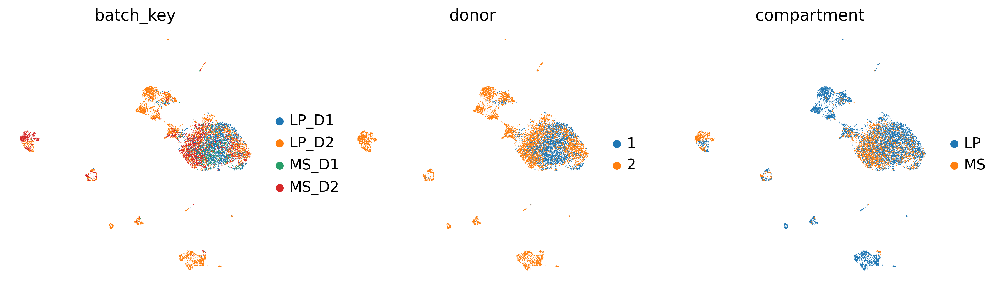

In [8]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata, min_dist=0.3)
sc.settings.figdir = "../analysis"
sc.pl.umap(
    adata,
    color=["batch_key", "donor", "compartment"],
    s=2,
    save="_full_data_qc.pdf"
)

/conda-global-envs/single-cell-analysis/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


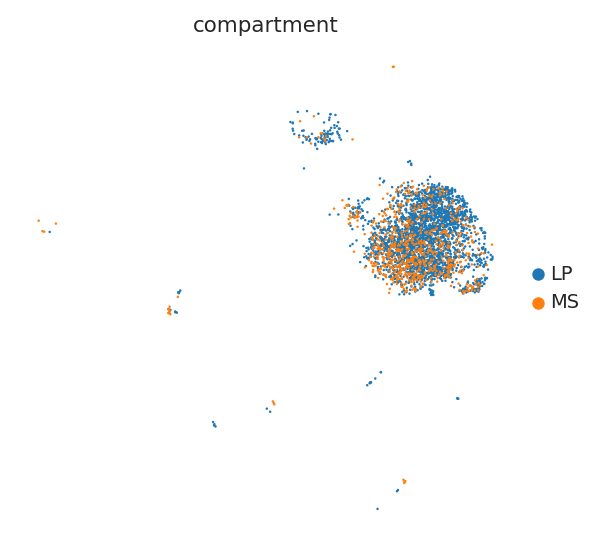

In [84]:
sc.pl.umap(
    adata[adata.obs.donor == "1"],
    color=["compartment"],
    s=5
)

/conda-global-envs/single-cell-analysis/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


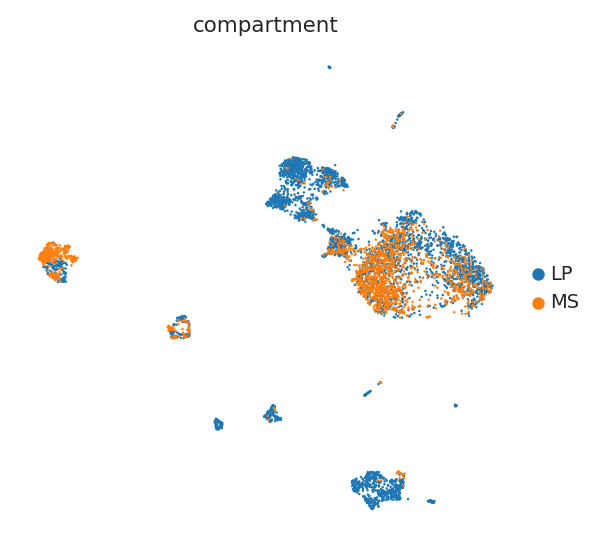

In [85]:
sc.pl.umap(
    adata[adata.obs.donor == "2"],
    color=["compartment"],
    s=5
)

# Clustering

In [ ]:
sc.tl.leiden(adata, key_added="leiden_scVI", resolution=0.4)
sc.pl.umap(
    adata,
    color=["leiden_scVI"],
    legend_loc="on data",
)

# Celltypist

In [96]:
models.download_models(force_update = True)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 18
📂 Storing models in /home/joe/.celltypist/data/models
💾 Downloading model [1/18]: Immune_All_Low.pkl
💾 Downloading model [2/18]: Immune_All_High.pkl
💾 Downloading model [3/18]: Adult_Mouse_Gut.pkl
💾 Downloading model [4/18]: Autopsy_COVID19_Lung.pkl
💾 Downloading model [5/18]: COVID19_Immune_Landscape.pkl
💾 Downloading model [6/18]: Cells_Fetal_Lung.pkl
💾 Downloading model [7/18]: Cells_Intestinal_Tract.pkl
💾 Downloading model [8/18]: Cells_Lung_Airway.pkl
💾 Downloading model [9/18]: Developing_Human_Brain.pkl
💾 Downloading model [10/18]: Developing_Human_Thymus.pkl
💾 Downloading model [11/18]: Developing_Mouse_Brain.pkl
💾 Downloading model [12/18]: Healthy_COVID19_PBMC.pkl
💾 Downloading model [13/18]: Human_IPF_Lung.pkl
💾 Downloading model [14/18]: Human_Lung_Atlas.pkl
💾 Downloading model [15/18]: Human_PF_Lung.pkl
💾 Downloading model [16/18]: Lethal_COVID19_Lung.pkl
💾

In [97]:
models.models_description()

👉 Detailed model information can be found at `https://www.celltypist.org/models`


,model,description
0,Immune_All_Low.pkl,immune sub-populations combined from 20 tissue...
1,Immune_All_High.pkl,immune populations combined from 20 tissues of...
2,Adult_Mouse_Gut.pkl,cell types in the adult mouse gut combined fro...
3,Autopsy_COVID19_Lung.pkl,cell types from the lungs of 16 SARS-CoV-2 inf...
4,COVID19_Immune_Landscape.pkl,immune subtypes from lung and blood of COVID-1...
5,Cells_Fetal_Lung.pkl,cell types from human embryonic and fetal lungs
6,Cells_Intestinal_Tract.pkl,"intestinal cells from fetal, pediatric (health..."
7,Cells_Lung_Airway.pkl,cell populations from scRNA-seq of five locati...
8,Developing_Human_Brain.pkl,cell types from the first-trimester developing...
9,Developing_Human_Thymus.pkl,"cell populations in embryonic, fetal, pediatri..."


In [98]:
cellTypeModel = models.Model.load(model = 'Immune_All_Low.pkl')
cellTypeModel.cell_types

array(['B cells', 'B-cell lineage', 'Cycling cells', 'DC', 'DC precursor',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ETP',
       'Early MK', 'Endothelial cells', 'Epithelial cells',
       'Erythrocytes', 'Erythroid', 'Fibroblasts', 'Granulocytes',
       'HSC/MPP', 'ILC', 'ILC precursor', 'MNP', 'Macrophages',
       'Mast cells', 'Megakaryocyte precursor',
       'Megakaryocytes/platelets', 'Mono-mac', 'Monocyte precursor',
       'Monocytes', 'Myelocytes', 'Plasma cells', 'Promyelocytes',
       'T cells', 'pDC', 'pDC precursor'], dtype=object)

In [15]:
predictions = celltypist.annotate(adata, model = 'Immune_All_High.pkl', majority_voting = True)
predictionsLow = celltypist.annotate(adata, model = 'Immune_All_Low.pkl', majority_voting = True)

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will try the `.raw` attribute
🔬 Input data has 8702 cells and 31482 genes
🔗 Matching reference genes in the model
🧬 6037 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!
👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will try the `.raw` attribute
🔬 Input data has 8702 cells and 31482 genes
🔗 Matching reference genes in the model
🧬 6037 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority vot

In [ ]:
del adata.obs["majority_voting"]
del adata.obs["predicted_labels"]

In [195]:
del adata.obs["ILC1"]
del adata.obs["ILC2"]
del adata.obs["ILC3"]

In [16]:
adata.obs = adata.obs.join(predictionsLow.probability_matrix[["ILC1", "ILC2", "ILC3"]])

In [197]:
adata.obs["majority_voting_low"] = predictionsLow.predicted_labels["majority_voting"]

In [198]:
adata.obs = adata.obs.join(predictions.predicted_labels)

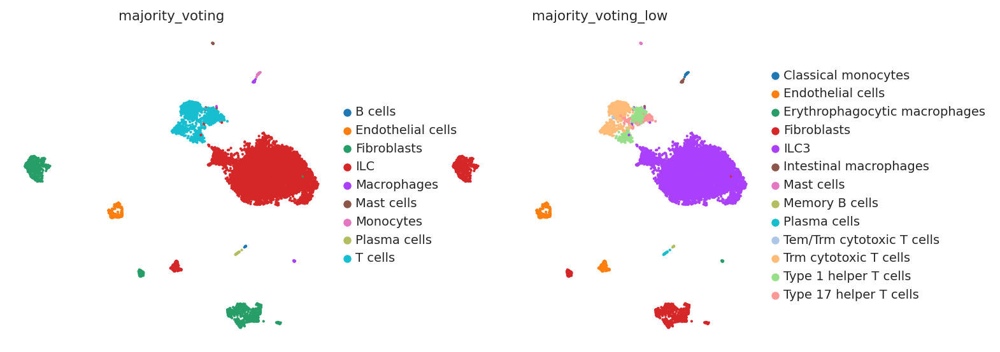

In [200]:
sc.settings.figdir = "../analysis"
sc.pl.umap(
    adata,
    color=["majority_voting", "majority_voting_low"],
    save="_celltypist_annotations.pdf"
)

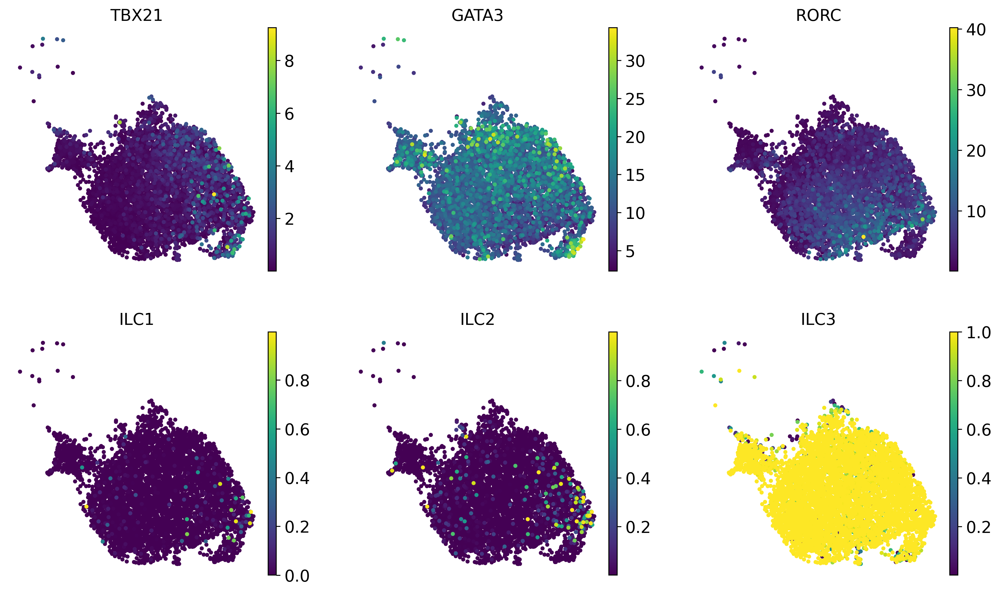

In [19]:
sc.pl.umap(
    adata[adata.obs.majority_voting_low == "ILC3"],
    color=["TBX21", "GATA3", "RORC", "ILC1", "ILC2", "ILC3"],
    cmap="viridis",
    layer="scVI_normalized",
    ncols=3,
    s=50
    # save="_celltypist_annotations.pdf"
)

# Subset on ILC

In [123]:
adataSubset = adata[(adata.obs.majority_voting == "ILC") & (adata.obs.majority_voting_low != "Endothelial cells")].copy()
adataRaw = sc.read(f"{processedDataPath}/human_ILC2/h5ad_files/human_merged_raw.h5ad")
adataRaw = adataRaw[adataRaw.obs.index.isin(adataSubset.obs.index)]
adataSubset = adataRaw

In [124]:
adataSubset

View of AnnData object with n_obs × n_vars = 5952 × 31482
    obs: 'batch_key', 'donor', 'compartment', 'scrublet_score', 'scrublet_called_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'log1p'
    layers: 'raw_counts'

## New HVGs

In [125]:
sc.pp.highly_variable_genes(
    adataSubset,
    n_top_genes=3000, # Number of HVGs to keep
    subset=False, # Subset the adata in place
    layer="raw_counts", # Use the raw counts data for calculations
    flavor="seurat_v3", # HVG algorithm to use
    batch_key="batch_key", # Column in adata.obs that annotates batches of data
)

In [29]:
LPgenes = list(pd.read_csv("../LP_DE_genes_human.csv")["x"])
MSgenes = list(pd.read_csv("../MS_DE_genes_human.csv")["x"])

In [39]:
adataSubset

AnnData object with n_obs × n_vars = 5952 × 3247
    obs: 'batch_key', 'donor', 'compartment', 'scrublet_score', 'scrublet_called_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'MS/LP_log_density_ratio'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'include_gene'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'batch_key_colors', 'compartment_colors', 'donor_colors', 'hvg', 'leiden', 'leiden_scVI_colors', 'log1p', 'neighbors', 'tsne', 'umap'
    obsm: 'X_scVI', 'X_tsne', 'X_umap'
    layers: 'raw_counts', 'scVI_normalized'
    obsp: 'connectivities', 'distances'

In [40]:
119+127

246

In [37]:
len([i for i in adataSubset.var_names if i in LPgenes and not adataSubset.var.loc[i, "highly_variable"]])

119

In [38]:
len([i for i in adataSubset.var_names if i in MSgenes and not adataSubset.var.loc[i, "highly_variable"]])

127

In [135]:
include_genes = ["RORC"] + LPgenes + MSgenes
include_genes = [i for i in include_genes if i in adataSubset.var_names]

In [152]:
adataSubset.var["include_gene"] = [True if adataSubset.var.loc[i, "highly_variable"] or i in include_genes else False for i in adataSubset.var_names]

In [160]:
adataSubset = adataSubset[:, adataSubset.var.include_gene].copy()

## New scVI model

In [161]:
# Setup scVI model using raw counts and batch info
scvi.model.SCVI.setup_anndata(
    adataSubset,
    layer="raw_counts",
    batch_key="batch_key",
)
modelSubset = scvi.model.SCVI(adataSubset)

In [162]:
# Train scVI model - run on google colab with a GPU session or a PC with an Nvidia GPU
modelSubset.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 400/400: 100%|██████████| 400/400 [01:21<00:00,  4.92it/s, loss=1.12e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [01:21<00:00,  4.90it/s, loss=1.12e+03, v_num=1]


In [163]:
# Check save paths
if not os.path.isdir(f"{processedDataPath}/human_ILC2/scVI_models"):
    os.makedirs(f"{processedDataPath}/human_ILC2/scVI_models")
    
if not os.path.isdir(f"{processedDataPath}/human_ILC2/h5ad_files"):
    os.makedirs(f"{processedDataPath}/human_ILC2/h5ad_files")
    
if os.path.isdir(f"{processedDataPath}/human_ILC2/scVI_models/human_merged_ILC_subset_3000_HVG"):
    shutil.rmtree(f"{processedDataPath}/human_ILC2/scVI_models/human_merged_ILC_subset_3000_HVG")
    
# save the scVI model and adata object before further processing because training is non-deterministic
modelSubset.save(f"{processedDataPath}/human_ILC2/scVI_models/human_merged_ILC_subset_3000_HVG")

In [164]:
# get scVI latent space and normalized expression
adataSubset.obsm["X_scVI"] = modelSubset.get_latent_representation()
adataSubset.layers["scVI_normalized"] = modelSubset.get_normalized_expression(library_size=1e4)

## New UMAP

In [165]:
sc.pp.neighbors(adataSubset, use_rep="X_scVI")
sc.tl.umap(adataSubset, min_dist=0.3)
sc.tl.tsne(adataSubset, use_rep="X_scVI")

## Recluster

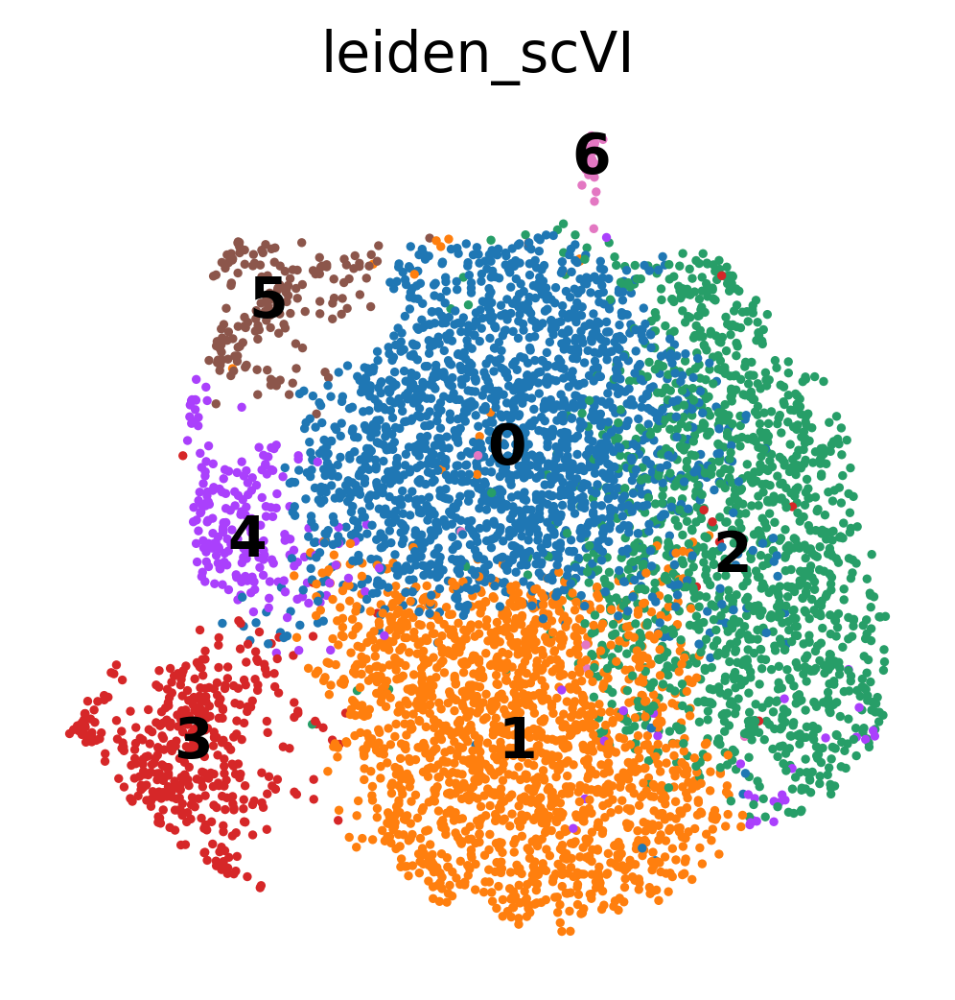

In [12]:
sc.tl.leiden(adataSubset, key_added="leiden_scVI", resolution=0.45)
sc.settings.figdir = "../analysis"
sc.pl.umap(
    adataSubset,
    color=["leiden_scVI"],
    legend_loc="on data",
    save="_ILC_clusters.pdf"
)

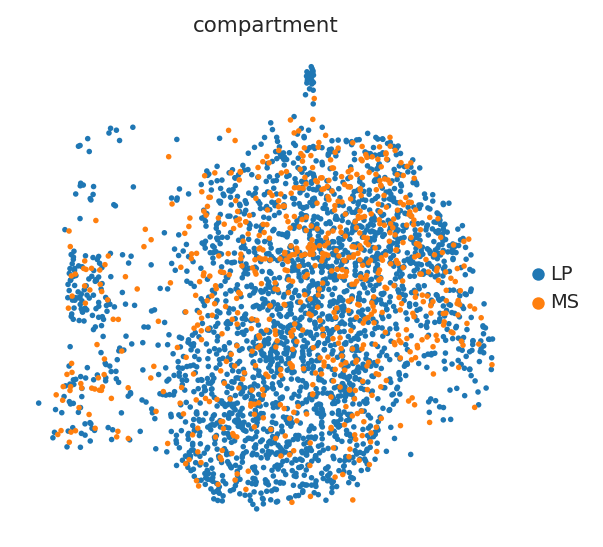

In [167]:
sc.pl.umap(
    adataSubset[adataSubset.obs.donor == "1"],
    color=["compartment"],
    s=25
)

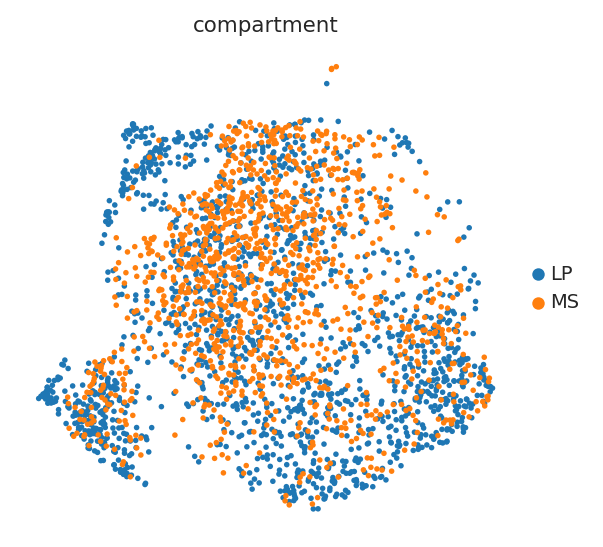

In [168]:
sc.pl.umap(
    adataSubset[adataSubset.obs.donor == "2"],
    color=["compartment"],
    s=25
)

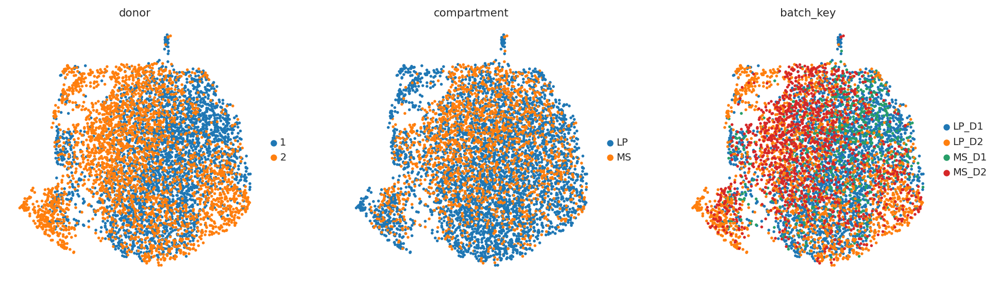

In [169]:
sc.settings.figdir = "../analysis"
sc.pl.umap(
    adataSubset,
    color=["donor", "compartment", "batch_key"],
    s=25,
    save="_qc_metadata.pdf"
)

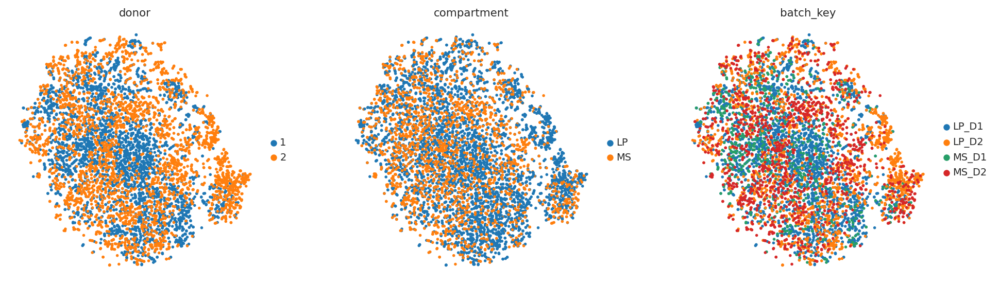

In [173]:
sc.pl.tsne(
    adataSubset,
    color=["donor", "compartment", "batch_key"],
    s=25,
    # save="_qc_metadata.pdf"
)

# Plot genes

## UMAP embedding

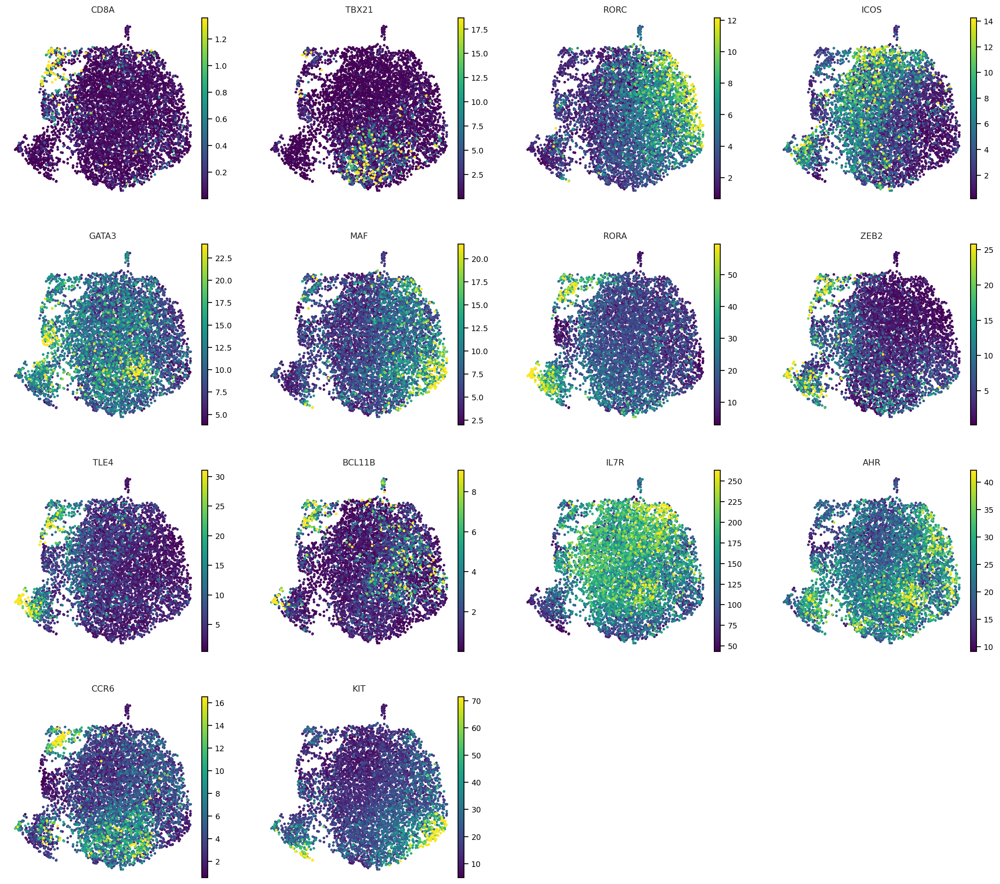

In [171]:
geneList = [
    "CD8A", # T cells
    "TBX21", "RORC",
    "ICOS", # ILC1/2
    "GATA3", "MAF", "RORA", "ZEB2", "TLE4", "BCL11B", "IL7R", #ILC2
    "AHR", "CCR6", #ILC3
    "KIT", # Non-ILC
]
sc.settings.figdir = "../analysis"

rna.pl.gene_embedding(
    adataSubset,
    geneList,
    layer="scVI_normalized", # can be a layer (i.e. 'raw_counts') or 'X'
    figsize = (4, 4), # size of each panel
    dpi = 80, # resolution of figure to show
    dpi_save = 300, # resolution of figure to save
    min_quantile = 0.01, # the quantile of expression for a gene to set the minimum of the colorbar to
    max_quantile = 0.99, # the quantile of expression for a gene to set the maximum of the colorbar to
    cmap="viridis",
    # save="_marker_genes_scvi_expression.png",
    s=35
)

# Save anndata

In [172]:
adata.write(f"{processedDataPath}/human_ILC2/h5ad_files/human_merged_5000_HVG.h5ad")

In [12]:
adata = sc.read(f"{processedDataPath}/human_ILC2/h5ad_files/human_merged_5000_HVG.h5ad")

In [28]:
adata

AnnData object with n_obs × n_vars = 8702 × 31482
    obs: 'batch_key', 'donor', 'compartment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'scrublet_score', 'scrublet_called_doublet'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    layers: 'raw_counts'

In [13]:
adataSubset.write(f"{processedDataPath}/human_ILC2/h5ad_files/human_merged_ILC_subset_3000_HVG.h5ad")

In [26]:
adataSubset = sc.read(f"{processedDataPath}/human_ILC2/h5ad_files/human_merged_ILC_subset_3000_HVG.h5ad")

In [27]:
adataSubset

AnnData object with n_obs × n_vars = 5952 × 3247
    obs: 'batch_key', 'donor', 'compartment', 'scrublet_score', 'scrublet_called_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'MS/LP_log_density_ratio'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'include_gene'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'batch_key_colors', 'compartment_colors', 'donor_colors', 'hvg', 'leiden', 'leiden_scVI_colors', 'log1p', 'neighbors', 'tsne', 'umap'
    obsm: 'X_scVI', 'X_tsne', 'X_umap'
    layers: 'raw_counts', 'scVI_normalized'
    obsp: 'connectivities', 'distances'